In [2]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pe
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster import hierarchy
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import normalize
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250
sns.set_style('darkgrid')
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

## EastWestAirlines

In [3]:
airlines = pd.read_excel(r'C:\Users\shree\Desktop\subject\Data_Science\DS_Assignments\Datasets\EastWestAirlines.xlsx',sheet_name="data")
airlines

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [4]:
airlines = airlines.drop(columns = ['ID#'])

In [5]:
airlines.shape

(3999, 11)

In [6]:
airlines.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   Balance            3999 non-null   int64
 1   Qual_miles         3999 non-null   int64
 2   cc1_miles          3999 non-null   int64
 3   cc2_miles          3999 non-null   int64
 4   cc3_miles          3999 non-null   int64
 5   Bonus_miles        3999 non-null   int64
 6   Bonus_trans        3999 non-null   int64
 7   Flight_miles_12mo  3999 non-null   int64
 8   Flight_trans_12    3999 non-null   int64
 9   Days_since_enroll  3999 non-null   int64
 10  Award?             3999 non-null   int64
dtypes: int64(11)
memory usage: 343.8 KB


In [7]:
airlines.isnull().sum()

Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award?               0
dtype: int64

In [8]:
airlines.head(5)

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,28143,0,1,1,1,174,1,0,0,7000,0
1,19244,0,1,1,1,215,2,0,0,6968,0
2,41354,0,1,1,1,4123,4,0,0,7034,0
3,14776,0,1,1,1,500,1,0,0,6952,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1


In [9]:
airlines = airlines.rename(columns = {'Award?':'award'})
airlines

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award
0,28143,0,1,1,1,174,1,0,0,7000,0
1,19244,0,1,1,1,215,2,0,0,6968,0
2,41354,0,1,1,1,4123,4,0,0,7034,0
3,14776,0,1,1,1,500,1,0,0,6952,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1
3995,64385,0,1,1,1,981,5,0,0,1395,1
3996,73597,0,3,1,1,25447,8,0,0,1402,1
3997,54899,0,1,1,1,500,1,500,1,1401,0


In [10]:
airlines.describe()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award
count,3.999000e+03,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.00000,3999.000000,3999.000000,3999.00000,3999.000000
mean,7.360133e+04,144.114529,2.059515,1.014504,1.012253,17144.846212,11.60190,460.055764,1.373593,4118.55939,0.370343
std,1.007757e+05,773.663804,1.376919,0.147650,0.195241,24150.967826,9.60381,1400.209171,3.793172,2065.13454,0.482957
min,0.000000e+00,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,2.00000,0.000000
25%,1.852750e+04,0.000000,1.000000,1.000000,1.000000,1250.000000,3.00000,0.000000,0.000000,2330.00000,0.000000
50%,4.309700e+04,0.000000,1.000000,1.000000,1.000000,7171.000000,12.00000,0.000000,0.000000,4096.00000,0.000000
75%,9.240400e+04,0.000000,3.000000,1.000000,1.000000,23800.500000,17.00000,311.000000,1.000000,5790.50000,1.000000
max,1.704838e+06,11148.000000,5.000000,3.000000,5.000000,263685.000000,86.00000,30817.000000,53.000000,8296.00000,1.000000


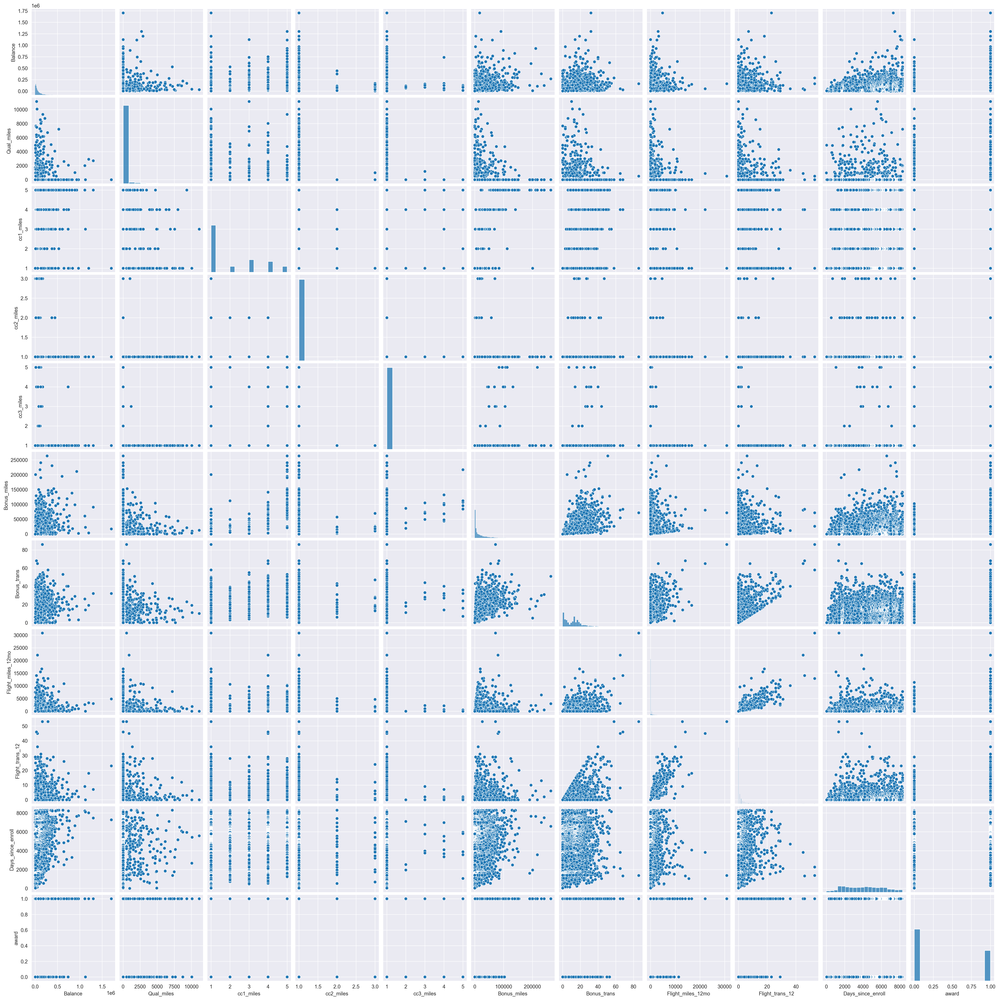

In [11]:
sns.pairplot(airlines)

### Feature Scaling

In [12]:
sc = StandardScaler()

x = sc.fit_transform(airlines)
x = pd.DataFrame(x)
x

,0,1,2,3,4,5,6,7,8,9,10
0,-0.451141,-0.186299,-0.769578,-0.098242,-0.062767,-0.702786,-1.104065,-0.328603,-0.362168,1.395454,-0.766919
1,-0.539457,-0.186299,-0.769578,-0.098242,-0.062767,-0.701088,-0.999926,-0.328603,-0.362168,1.379957,-0.766919
2,-0.320031,-0.186299,-0.769578,-0.098242,-0.062767,-0.539253,-0.791649,-0.328603,-0.362168,1.411920,-0.766919
3,-0.583799,-0.186299,-0.769578,-0.098242,-0.062767,-0.689286,-1.104065,-0.328603,-0.362168,1.372208,-0.766919
4,0.239678,-0.186299,1.409471,-0.098242,-0.062767,1.083121,1.499394,1.154932,0.692490,1.363975,1.303918
...,...,...,...,...,...,...,...,...,...,...,...
3994,-0.547079,-0.186299,-0.769578,-0.098242,-0.062767,-0.356960,-0.791649,-0.185750,-0.098503,-1.315120,1.303918
3995,-0.091465,-0.186299,-0.769578,-0.098242,-0.062767,-0.669367,-0.687511,-0.328603,-0.362168,-1.318994,1.303918
3996,-0.000043,-0.186299,0.683121,-0.098242,-0.062767,0.343804,-0.375096,-0.328603,-0.362168,-1.315604,1.303918
3997,-0.185607,-0.186299,-0.769578,-0.098242,-0.062767,-0.689286,-1.104065,0.028531,-0.098503,-1.316088,-0.766919


In [15]:
x_normalize = pd.DataFrame(normalize(airlines), columns= airlines.columns)
x_normalize

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award
0,0.970414,0.0,0.000034,0.000034,0.000034,0.006000,0.000034,0.000000,0.000000,0.241371,0.000000
1,0.940209,0.0,0.000049,0.000049,0.000049,0.010504,0.000098,0.000000,0.000000,0.340437,0.000000
2,0.981113,0.0,0.000024,0.000024,0.000024,0.097817,0.000095,0.000000,0.000000,0.166880,0.000000
3,0.904428,0.0,0.000061,0.000061,0.000061,0.030605,0.000061,0.000000,0.000000,0.425527,0.000000
4,0.912226,0.0,0.000037,0.000009,0.000009,0.404078,0.000243,0.019383,0.000037,0.064718,0.000009
...,...,...,...,...,...,...,...,...,...,...,...
3994,0.905810,0.0,0.000049,0.000049,0.000049,0.417949,0.000196,0.009805,0.000049,0.068784,0.000049
3995,0.999649,0.0,0.000016,0.000016,0.000016,0.015231,0.000078,0.000000,0.000000,0.021659,0.000016
3996,0.944948,0.0,0.000039,0.000013,0.000013,0.326726,0.000103,0.000000,0.000000,0.018001,0.000013
3997,0.999592,0.0,0.000018,0.000018,0.000018,0.009104,0.000018,0.009104,0.000018,0.025509,0.000000


# Model Building

## Hierarchical Clustering

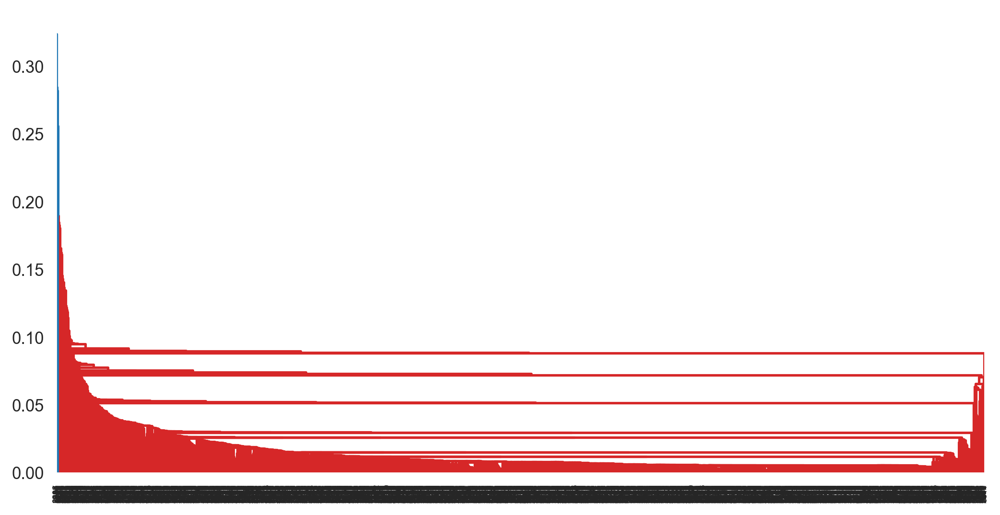

In [14]:
lk = hierarchy.linkage(x_normalize,method='single')
dendrogram = hierarchy.dendrogram(lk)

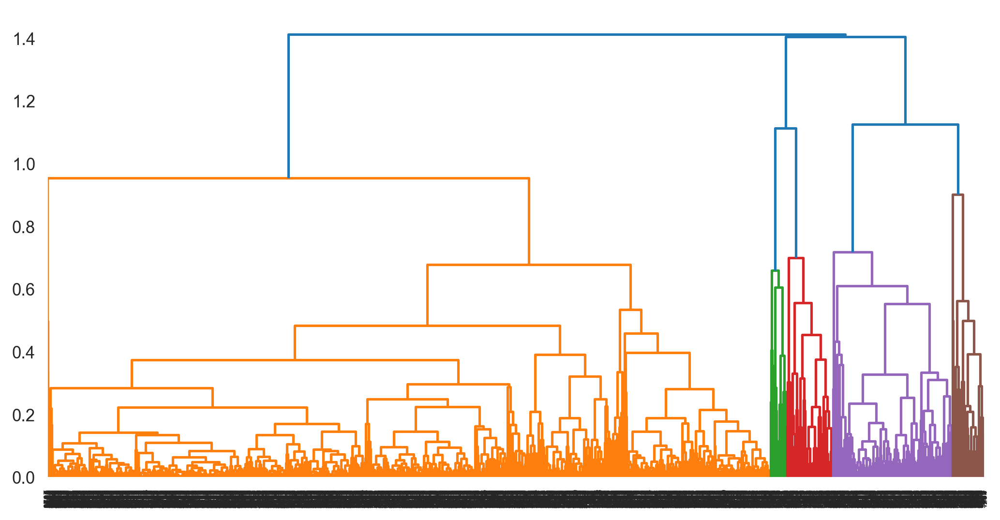

In [15]:
lk = hierarchy.linkage(x_normalize,method='complete')
dendrogram = hierarchy.dendrogram(lk)
plt.axhline(y = 25, c = 'red', linestyle = '--')

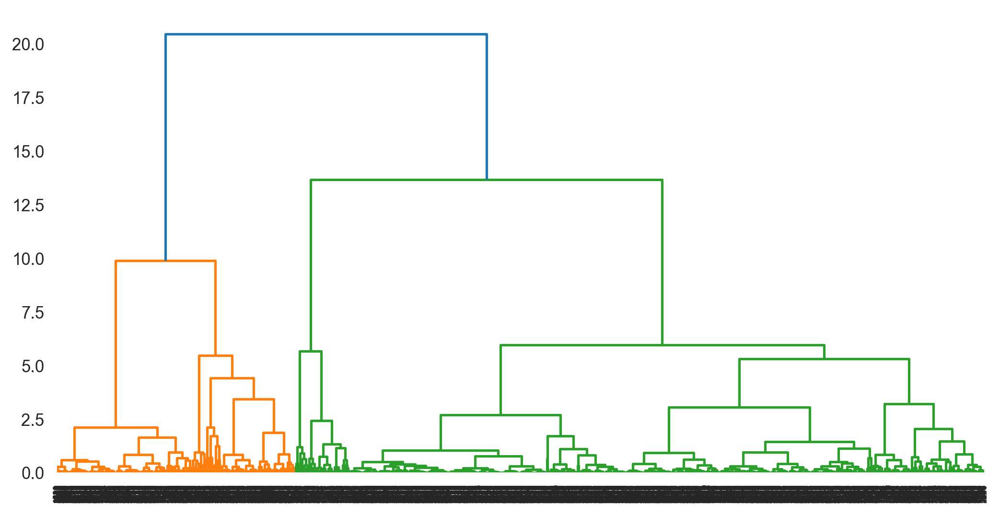

In [16]:
lk = hierarchy.linkage(x_normalize,method='ward')
dendrogram = hierarchy.dendrogram(lk)

In [17]:
hc = AgglomerativeClustering(n_clusters=2)

y = hc.fit_predict(x_normalize)

In [18]:
y

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [19]:
airlines['Cluster_h'] = y
airlines

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award,Cluster_h
0,28143,0,1,1,1,174,1,0,0,7000,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1,1
3995,64385,0,1,1,1,981,5,0,0,1395,1,0
3996,73597,0,3,1,1,25447,8,0,0,1402,1,0
3997,54899,0,1,1,1,500,1,500,1,1401,0,0


In [20]:
airlines.groupby('Cluster_h').agg('mean')

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award
Cluster_h,,,,,,,,,,,
0,80882.240984,158.251095,1.638018,1.009100,1.001348,9985.079205,9.527132,444.995956,1.325918,4110.677115,0.265588
1,52668.701550,103.471899,3.271318,1.030039,1.043605,37729.176357,17.566860,503.352713,1.510659,4141.220930,0.671512


<Axes: xlabel='Qual_miles', ylabel='award'>

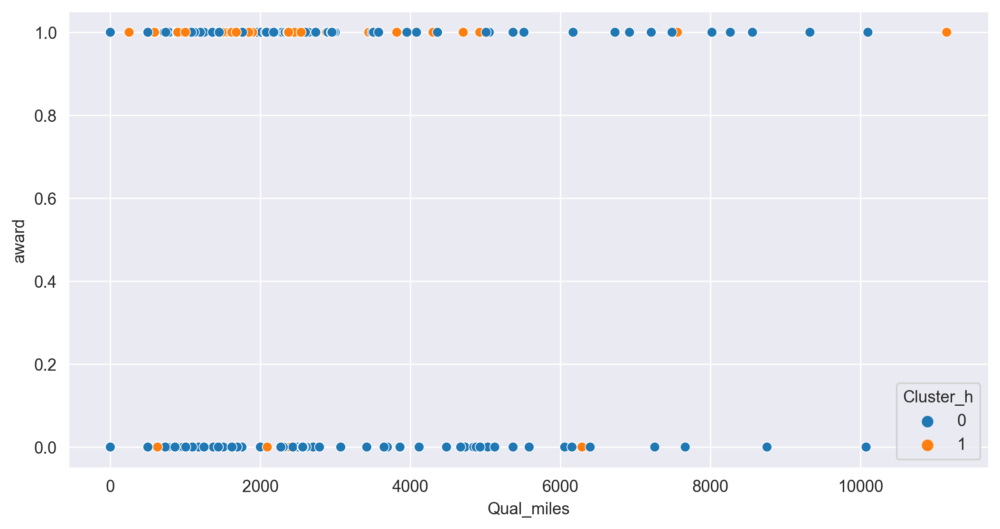

In [21]:
sns.scatterplot(x = airlines['Qual_miles'], y = airlines['award'],hue = airlines['Cluster_h'])

In [22]:
airlines[airlines['Cluster_h'] == 0]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award,Cluster_h
0,28143,0,1,1,1,174,1,0,0,7000,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0
5,16420,0,1,1,1,0,0,0,0,6942,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3993,3974,0,1,1,1,365,3,0,0,1397,0,0
3995,64385,0,1,1,1,981,5,0,0,1395,1,0
3996,73597,0,3,1,1,25447,8,0,0,1402,1,0
3997,54899,0,1,1,1,500,1,500,1,1401,0,0


In [23]:
data = pd.DataFrame(x_normalize)
data

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award
0,0.970414,0.0,0.000034,0.000034,0.000034,0.006000,0.000034,0.000000,0.000000,0.241371,0.000000
1,0.940209,0.0,0.000049,0.000049,0.000049,0.010504,0.000098,0.000000,0.000000,0.340437,0.000000
2,0.981113,0.0,0.000024,0.000024,0.000024,0.097817,0.000095,0.000000,0.000000,0.166880,0.000000
3,0.904428,0.0,0.000061,0.000061,0.000061,0.030605,0.000061,0.000000,0.000000,0.425527,0.000000
4,0.912226,0.0,0.000037,0.000009,0.000009,0.404078,0.000243,0.019383,0.000037,0.064718,0.000009
...,...,...,...,...,...,...,...,...,...,...,...
3994,0.905810,0.0,0.000049,0.000049,0.000049,0.417949,0.000196,0.009805,0.000049,0.068784,0.000049
3995,0.999649,0.0,0.000016,0.000016,0.000016,0.015231,0.000078,0.000000,0.000000,0.021659,0.000016
3996,0.944948,0.0,0.000039,0.000013,0.000013,0.326726,0.000103,0.000000,0.000000,0.018001,0.000013
3997,0.999592,0.0,0.000018,0.000018,0.000018,0.009104,0.000018,0.009104,0.000018,0.025509,0.000000


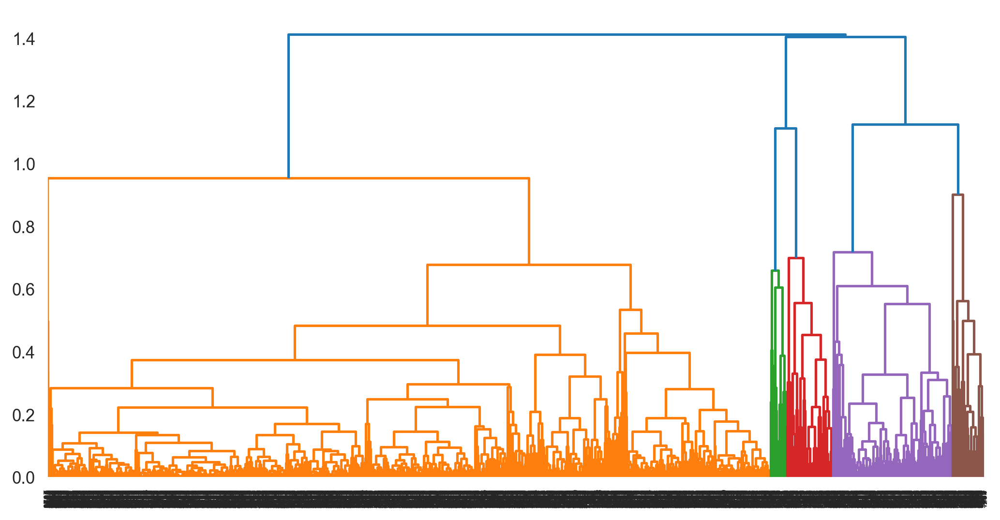

In [24]:
lk = hierarchy.linkage(data, method='complete')
dendrogram = hierarchy.dendrogram(lk)
plt.axhline(y = 20,linestyle = '--')

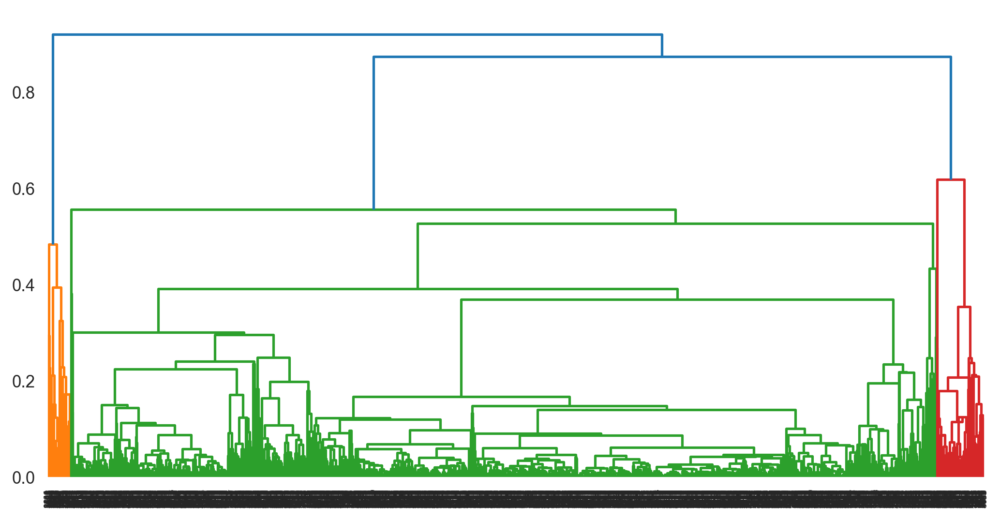

In [25]:
lk = hierarchy.linkage(data, method='centroid')
dendrogram = hierarchy.dendrogram(lk)
plt.axhline(y = 20,linestyle = '--')

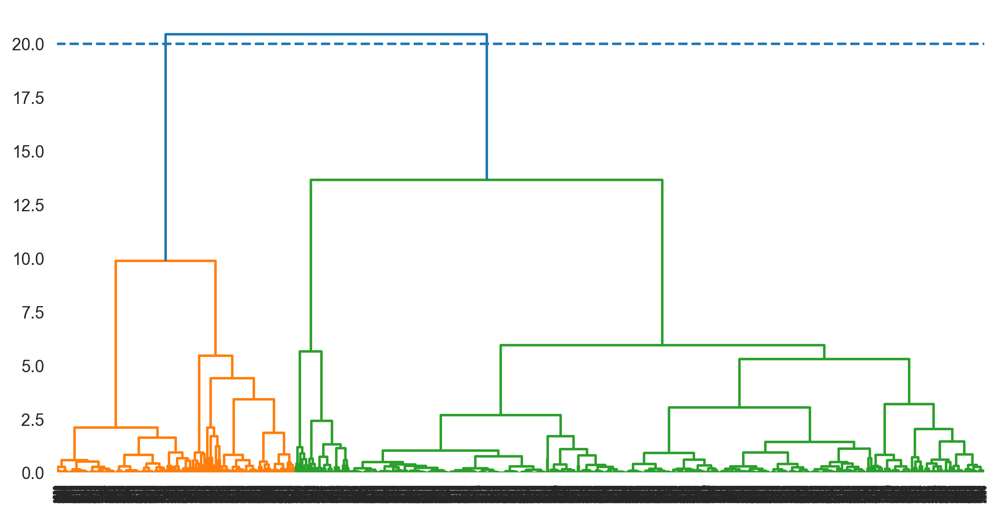

In [26]:
lk = hierarchy.linkage(data, method='ward')
dendrogram = hierarchy.dendrogram(lk)
plt.axhline(y = 20,linestyle = '--')

In [27]:
hc = AgglomerativeClustering(n_clusters=3)
y_h = hc.fit_predict(data)
y_h

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [28]:
airlines['y_h'] = y_h
airlines

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award,Cluster_h,y_h
0,28143,0,1,1,1,174,1,0,0,7000,0,0,1
1,19244,0,1,1,1,215,2,0,0,6968,0,0,1
2,41354,0,1,1,1,4123,4,0,0,7034,0,0,1
3,14776,0,1,1,1,500,1,0,0,6952,0,0,1
4,97752,0,4,1,1,43300,26,2077,4,6935,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1,1,0
3995,64385,0,1,1,1,981,5,0,0,1395,1,0,1
3996,73597,0,3,1,1,25447,8,0,0,1402,1,0,1
3997,54899,0,1,1,1,500,1,500,1,1401,0,0,1


In [29]:
airlines['y_h'].value_counts()

1    2738
0    1032
2     229
Name: y_h, dtype: int64

<Axes: xlabel='Balance', ylabel='y_h'>

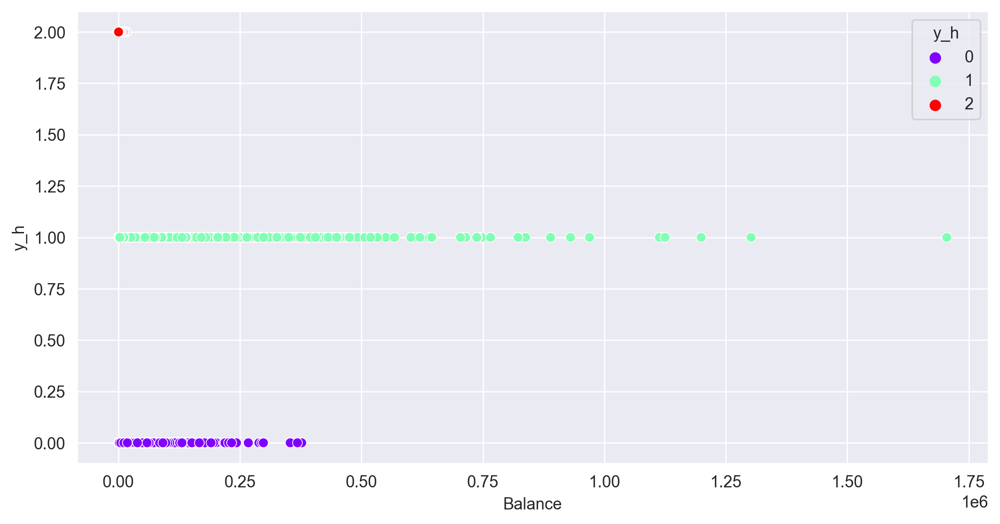

In [31]:
sns.scatterplot(x = airlines['Balance'] , y = airlines['y_h']  , hue=airlines['y_h'] , palette= 'rainbow')

In [32]:
airlines.groupby('y_h').agg('mean')

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award,Cluster_h
y_h,,,,,,,,,,,,
0,52668.701550,103.471899,3.271318,1.030039,1.043605,37729.176357,17.566860,503.352713,1.510659,4141.220930,0.671512,1.0
1,87185.011687,170.754565,1.691381,1.009861,1.001461,10771.319211,10.123083,476.612126,1.419284,4046.725712,0.276844,0.0
2,5524.222707,8.755459,1.000000,1.000000,1.000000,584.532751,2.401747,66.982533,0.209607,4875.301310,0.131004,0.0


<Axes: xlabel='Balance', ylabel='Bonus_miles'>

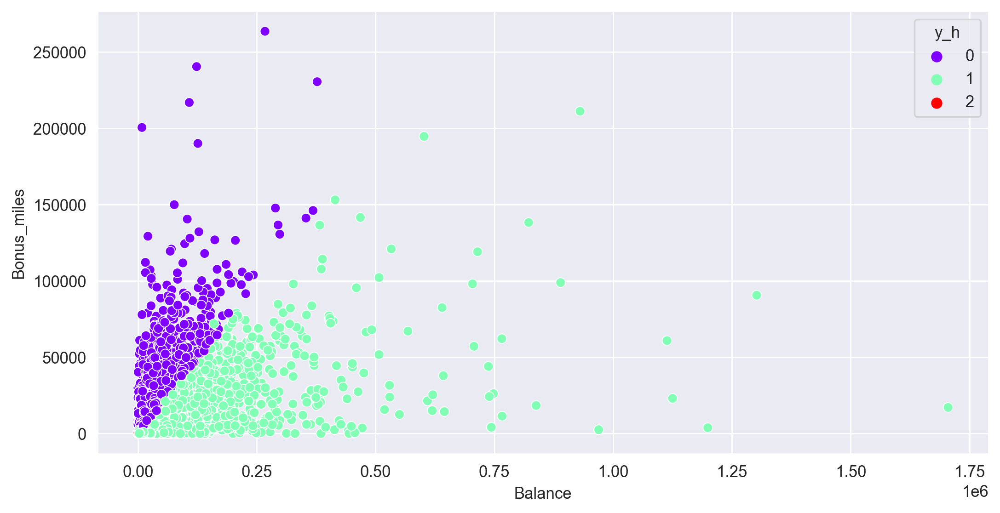

In [33]:
sns.scatterplot(x = airlines['Balance'],y = airlines['Bonus_miles'], hue = airlines['y_h'], palette='rainbow')

In [34]:
airlines[airlines['y_h'] == 2]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award,Cluster_h,y_h
27,8828,0,1,1,1,0,0,0,0,7914,0,0,2
31,10021,0,1,1,1,0,0,0,0,7879,0,0,2
39,2176,0,1,1,1,0,0,0,0,7847,1,0,2
51,1300,0,1,1,1,370,1,0,0,6868,0,0,2
55,14448,0,1,1,1,1625,6,0,0,6856,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3861,3126,0,1,1,1,100,1,0,0,1634,0,0,2
3876,1000,0,1,1,1,0,0,0,0,1597,0,0,2
3942,2131,0,1,1,1,405,3,0,0,1480,0,0,2
3981,1010,0,1,1,1,0,0,0,0,1423,0,0,2


## K_Means Clustering

In [16]:
km = KMeans()
yp = km.fit_predict(x_normalize)
yp

array([6, 6, 7, ..., 0, 7, 6])

In [17]:
len(yp)

3999

In [18]:
#cluster centre
km.cluster_centers_

array([[9.64282071e-01, 2.21721821e-03, 4.11357593e-05, 2.52653173e-05,
        2.47682879e-05, 2.40194309e-01, 3.19153902e-04, 8.66140359e-03,
        2.41780280e-05, 7.03849006e-02, 5.90075977e-06],
       [6.92660975e-01, 2.14410205e-03, 9.06090193e-05, 4.83963353e-05,
        4.73778086e-05, 6.90041158e-01, 4.81241822e-04, 1.81255170e-02,
        5.99744485e-05, 1.22839201e-01, 2.31376501e-05],
       [8.81686454e-01, 2.32131964e-03, 6.03474186e-05, 3.01307895e-05,
        2.92279330e-05, 4.51478536e-01, 3.98641906e-04, 7.94692276e-03,
        2.48462635e-05, 8.31848139e-02, 1.08082989e-05],
       [7.56384582e-01, 1.46199312e-03, 1.88064070e-04, 1.88064070e-04,
        1.88064070e-04, 1.08754206e-01, 4.50119317e-04, 6.74677399e-03,
        1.93713542e-05, 6.13907568e-01, 1.91283054e-05],
       [3.00261321e-01, 2.28831994e-03, 8.68237672e-05, 3.83855066e-05,
        3.78124415e-05, 9.22118487e-01, 5.03048093e-04, 1.37748221e-02,
        4.01636207e-05, 1.39635027e-01, 3.69787575e-

In [19]:
pd.DataFrame(km.cluster_centers_)

,0,1,2,3,4,5,6,7,8,9,10
0,0.964282,2.217218e-03,0.000041,0.000025,0.000025,0.240194,0.000319,0.008661,0.000024,0.070385,0.000006
1,0.692661,2.144102e-03,0.000091,0.000048,0.000047,0.690041,0.000481,0.018126,0.000060,0.122839,0.000023
2,0.881686,2.321320e-03,0.000060,0.000030,0.000029,0.451479,0.000399,0.007947,0.000025,0.083185,0.000011
3,0.756385,1.461993e-03,0.000188,0.000188,0.000188,0.108754,0.000450,0.006747,0.000019,0.613908,0.000019
4,0.300261,2.288320e-03,0.000087,0.000038,0.000038,0.922118,0.000503,0.013775,0.000040,0.139635,0.000037
5,0.282631,8.673617e-19,0.000242,0.000240,0.000240,0.156694,0.000565,0.008176,0.000034,0.915018,0.000044
6,0.941692,4.431907e-03,0.000095,0.000095,0.000095,0.063600,0.000240,0.006168,0.000021,0.306695,0.000011
7,0.993512,3.793711e-03,0.000032,0.000030,0.000029,0.052625,0.000115,0.005344,0.000018,0.067797,0.000003


In [20]:
x_normalize

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award
0,0.970414,0.0,0.000034,0.000034,0.000034,0.006000,0.000034,0.000000,0.000000,0.241371,0.000000
1,0.940209,0.0,0.000049,0.000049,0.000049,0.010504,0.000098,0.000000,0.000000,0.340437,0.000000
2,0.981113,0.0,0.000024,0.000024,0.000024,0.097817,0.000095,0.000000,0.000000,0.166880,0.000000
3,0.904428,0.0,0.000061,0.000061,0.000061,0.030605,0.000061,0.000000,0.000000,0.425527,0.000000
4,0.912226,0.0,0.000037,0.000009,0.000009,0.404078,0.000243,0.019383,0.000037,0.064718,0.000009
...,...,...,...,...,...,...,...,...,...,...,...
3994,0.905810,0.0,0.000049,0.000049,0.000049,0.417949,0.000196,0.009805,0.000049,0.068784,0.000049
3995,0.999649,0.0,0.000016,0.000016,0.000016,0.015231,0.000078,0.000000,0.000000,0.021659,0.000016
3996,0.944948,0.0,0.000039,0.000013,0.000013,0.326726,0.000103,0.000000,0.000000,0.018001,0.000013
3997,0.999592,0.0,0.000018,0.000018,0.000018,0.009104,0.000018,0.009104,0.000018,0.025509,0.000000


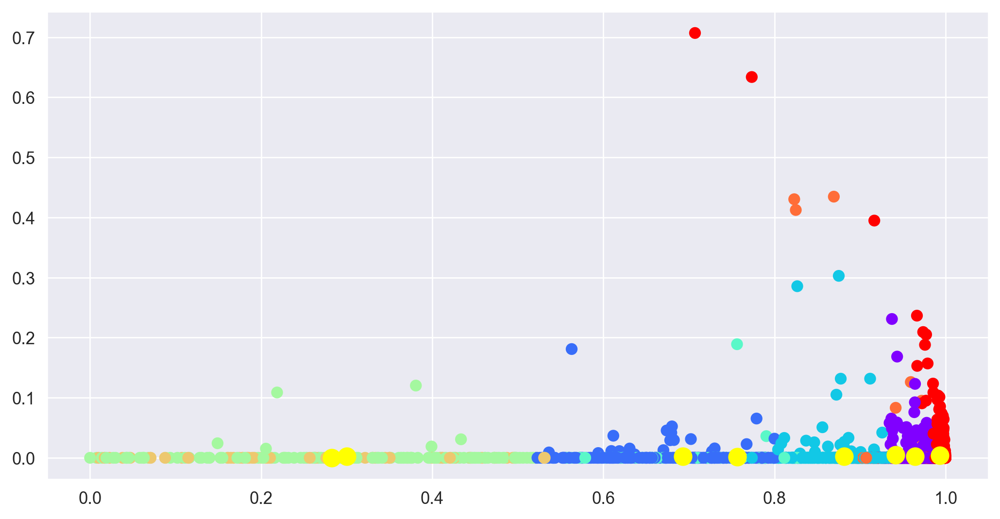

In [21]:
plt.scatter(x_normalize.iloc[:,0],x_normalize.iloc[:,1], c = yp, cmap='rainbow')
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1], c = 'yellow', s = 100)

In [24]:
fig = pe.scatter_3d(airlines, x = x_normalize['Balance'], y=x_normalize['cc1_miles'], z=x_normalize['cc2_miles'],color = None)
fig.show()

In [42]:
km.inertia_

51.94302840447625

### Elbow Graph

In [43]:
wcss = []

for i in range(1,20):
    km = KMeans(n_clusters=i)
    km.fit_predict(x_normalize)
    wcss.append(km.inertia_)

In [44]:
wcss

[484.85112913072527,
 267.5974109599186,
 173.27025625511416,
 116.32222839064853,
 90.82514805403548,
 70.47261345619677,
 60.07301180431013,
 51.93042285662658,
 47.36862831317899,
 43.057305758889235,
 39.4146846700538,
 36.12622439600068,
 33.30052126769471,
 31.18819805284544,
 29.323218797527762,
 27.404920855895618,
 26.010340770631586,
 24.980814520747067,
 23.846777158479675]

Text(0.5, 1.0, 'Elbow Graph')

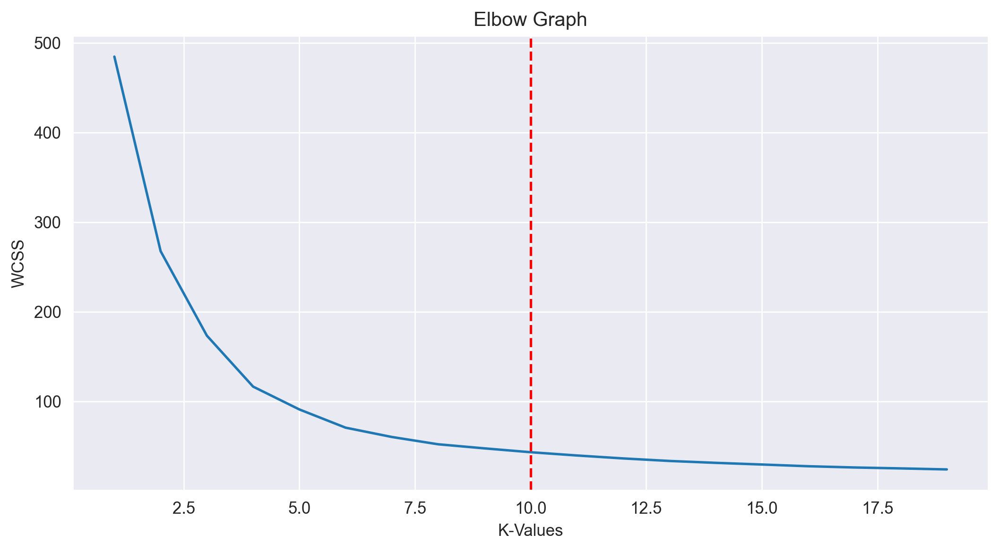

In [45]:
plt.plot(range(1,20),wcss)
plt.axvline(x = 10, linestyle = '--', color = 'red')
plt.xlabel('K-Values')
plt.ylabel('WCSS')
plt.title('Elbow Graph')

In [46]:
km = KMeans(n_clusters=3)
ypred = km.fit_predict(x_normalize)
ypred

array([1, 1, 1, ..., 1, 1, 1])

In [47]:
km.cluster_centers_

array([[7.02338636e-01, 2.28980600e-03, 7.65768389e-05, 3.73230172e-05,
        3.64701278e-05, 6.40793721e-01, 4.45405420e-04, 1.24002387e-02,
        4.00512974e-05, 1.06798676e-01, 2.03543650e-05],
       [9.72836988e-01, 3.32414272e-03, 4.32919764e-05, 3.57113618e-05,
        3.54643152e-05, 1.33988243e-01, 2.12339208e-04, 6.76790852e-03,
        2.11832537e-05, 9.87810579e-02, 5.46408972e-06],
       [6.28367461e-01, 9.22733365e-04, 2.09187388e-04, 2.08399081e-04,
        2.08399081e-04, 1.22789496e-01, 4.67319625e-04, 6.60686313e-03,
        2.22546388e-05, 6.87863931e-01, 2.57793632e-05]])

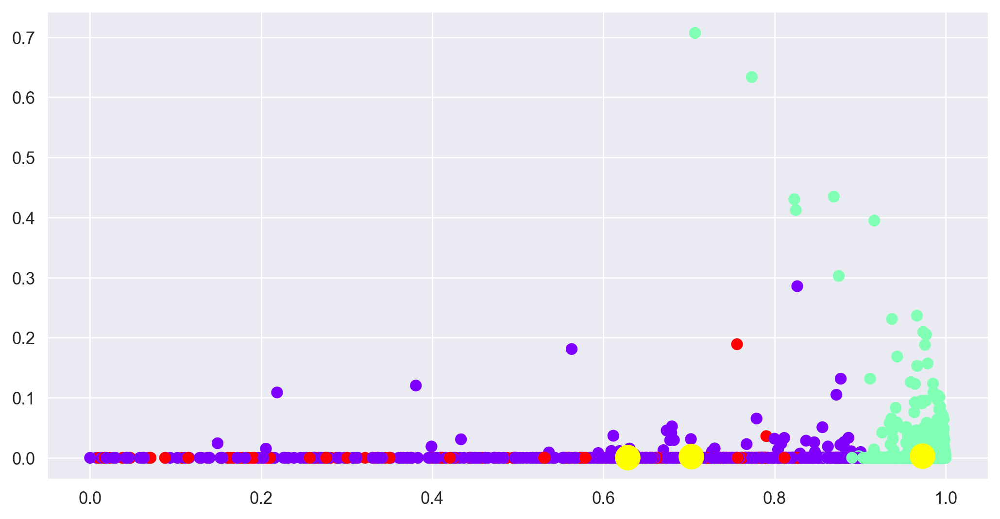

In [48]:
plt.scatter(x_normalize.iloc[:,0],x_normalize.iloc[:,1], c = ypred, cmap='rainbow')
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1], c = 'yellow',s = 200)

### Evaluation Of model

In [49]:
silhouette_score(x_normalize,ypred)

0.5723563868171324

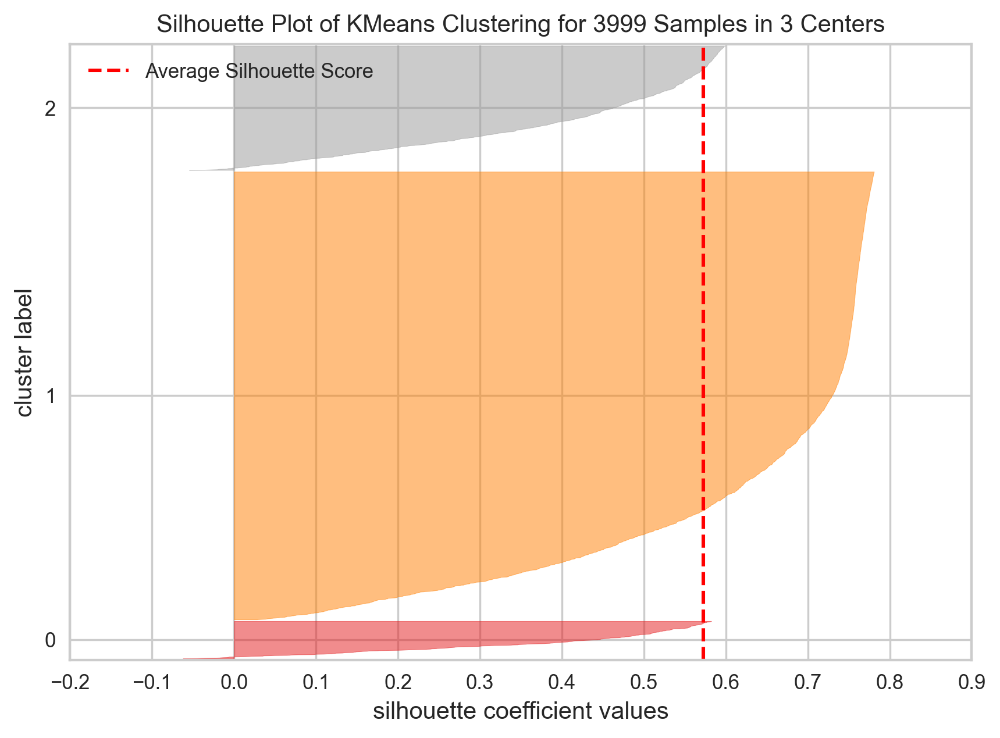

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 3999 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [50]:
from yellowbrick.cluster import SilhouetteVisualizer
model = SilhouetteVisualizer(KMeans(n_clusters=3))
vis = model.fit(x_normalize)
vis.show()


In [51]:
sil_score = []

for i in range(2,20):
    km = KMeans(n_clusters=i)
    y = km.fit_predict(x_normalize)
    sil_score.append(silhouette_score(x_normalize,y))

In [52]:
sil_score

[0.5555975280051119,
 0.5722202875931678,
 0.4948093555158908,
 0.5017460307175805,
 0.47823512906008314,
 0.43257735813877096,
 0.4374643553965765,
 0.4430214926568197,
 0.42640034538713245,
 0.39431435116973307,
 0.3767092187089402,
 0.3863301609663165,
 0.3857906682224534,
 0.37814858181054584,
 0.3714610121405344,
 0.37765216588324274,
 0.38321993076842625,
 0.38993769591434796]

In [53]:
#Analyzing clusters
airlines['cluster_k'] = ypred
airlines

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award,Cluster_h,y_h,cluster_k
0,28143,0,1,1,1,174,1,0,0,7000,0,0,1,1
1,19244,0,1,1,1,215,2,0,0,6968,0,0,1,1
2,41354,0,1,1,1,4123,4,0,0,7034,0,0,1,1
3,14776,0,1,1,1,500,1,0,0,6952,0,0,1,1
4,97752,0,4,1,1,43300,26,2077,4,6935,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1,1,0,1
3995,64385,0,1,1,1,981,5,0,0,1395,1,0,1,1
3996,73597,0,3,1,1,25447,8,0,0,1402,1,0,1,1
3997,54899,0,1,1,1,500,1,500,1,1401,0,0,1,1


In [54]:
airlines[airlines['cluster_k'] == 0].mean()
airlines[airlines['cluster_k'] == 1].mean()

Balance              86644.267347
Qual_miles             164.398639
cc1_miles                1.797619
cc2_miles                1.011224
cc3_miles                1.001701
Bonus_miles          12329.190136
Bonus_trans             10.579252
Flight_miles_12mo      468.827551
Flight_trans_12          1.394218
Days_since_enroll     4046.339796
award                    0.288095
Cluster_h                0.068027
y_h                      0.935714
cluster_k                1.000000
dtype: float64

In [55]:
airlines.groupby('cluster_k').agg('mean')

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award,Cluster_h,y_h
cluster_k,,,,,,,,,,,,,
0,47062.690798,111.628221,3.319018,1.030675,1.053988,39388.652761,17.895706,546.411043,1.652761,4168.727607,0.722699,0.992638,0.007362
1,86644.267347,164.398639,1.797619,1.011224,1.001701,12329.190136,10.579252,468.827551,1.394218,4046.339796,0.288095,0.068027,0.935714
2,5087.991803,8.217213,1.008197,1.000000,1.000000,871.594262,2.901639,65.922131,0.192623,4821.176230,0.184426,0.094262,1.799180


In [56]:
airlines['cluster_k'].value_counts()

1    2940
0     815
2     244
Name: cluster_k, dtype: int64

## DBSCAN

In [57]:
airlines

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award,Cluster_h,y_h,cluster_k
0,28143,0,1,1,1,174,1,0,0,7000,0,0,1,1
1,19244,0,1,1,1,215,2,0,0,6968,0,0,1,1
2,41354,0,1,1,1,4123,4,0,0,7034,0,0,1,1
3,14776,0,1,1,1,500,1,0,0,6952,0,0,1,1
4,97752,0,4,1,1,43300,26,2077,4,6935,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1,1,0,1
3995,64385,0,1,1,1,981,5,0,0,1395,1,0,1,1
3996,73597,0,3,1,1,25447,8,0,0,1402,1,0,1,1
3997,54899,0,1,1,1,500,1,500,1,1401,0,0,1,1


In [62]:
x_normalize

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award
0,0.970414,0.0,0.000034,0.000034,0.000034,0.006000,0.000034,0.000000,0.000000,0.241371,0.000000
1,0.940209,0.0,0.000049,0.000049,0.000049,0.010504,0.000098,0.000000,0.000000,0.340437,0.000000
2,0.981113,0.0,0.000024,0.000024,0.000024,0.097817,0.000095,0.000000,0.000000,0.166880,0.000000
3,0.904428,0.0,0.000061,0.000061,0.000061,0.030605,0.000061,0.000000,0.000000,0.425527,0.000000
4,0.912226,0.0,0.000037,0.000009,0.000009,0.404078,0.000243,0.019383,0.000037,0.064718,0.000009
...,...,...,...,...,...,...,...,...,...,...,...
3994,0.905810,0.0,0.000049,0.000049,0.000049,0.417949,0.000196,0.009805,0.000049,0.068784,0.000049
3995,0.999649,0.0,0.000016,0.000016,0.000016,0.015231,0.000078,0.000000,0.000000,0.021659,0.000016
3996,0.944948,0.0,0.000039,0.000013,0.000013,0.326726,0.000103,0.000000,0.000000,0.018001,0.000013
3997,0.999592,0.0,0.000018,0.000018,0.000018,0.009104,0.000018,0.009104,0.000018,0.025509,0.000000


In [70]:
db = DBSCAN(eps=0.5, min_samples=3)
y_d = db.fit_predict(x)

In [71]:
y_d = pd.Series(y_d)
y_d.value_counts()

 0     1476
-1     1228
 1      286
 8      246
 6      178
 5      131
 2      126
 9      115
 11      53
 3       26
 29      10
 35       9
 21       9
 30       7
 38       7
 24       5
 36       5
 4        5
 10       5
 32       4
 28       4
 25       4
 18       4
 19       4
 7        4
 20       3
 31       3
 17       3
 33       3
 12       3
 37       3
 34       3
 13       3
 23       3
 14       3
 27       3
 15       3
 22       3
 16       3
 26       3
 39       3
dtype: int64

In [72]:
silhouette_score(x,y_d)

-0.11448578186172835

In [73]:
neigh = NearestNeighbors(n_neighbors=3).fit(x)
d,i = neigh.kneighbors(x)

In [74]:
pd.DataFrame(d)

,0,1,2
0,0.0,0.111847,0.120342
1,0.0,0.114063,0.114376
2,0.0,0.165402,0.194589
3,0.0,0.048375,0.058575
4,0.0,0.545493,0.735055
...,...,...,...
3994,0.0,0.288941,0.335142
3995,0.0,0.312801,0.343099
3996,0.0,0.166148,0.280243
3997,0.0,0.257255,0.271674


In [75]:
d

array([[0.        , 0.11184685, 0.12034246],
       [0.        , 0.11406276, 0.11437601],
       [0.        , 0.16540223, 0.19458949],
       ...,
       [0.        , 0.16614779, 0.28024323],
       [0.        , 0.25725534, 0.27167409],
       [0.        , 0.00270574, 0.0112955 ]])

In [76]:
dist = np.sort(d[:,1])

Text(0, 0.5, 'Epsilon value')

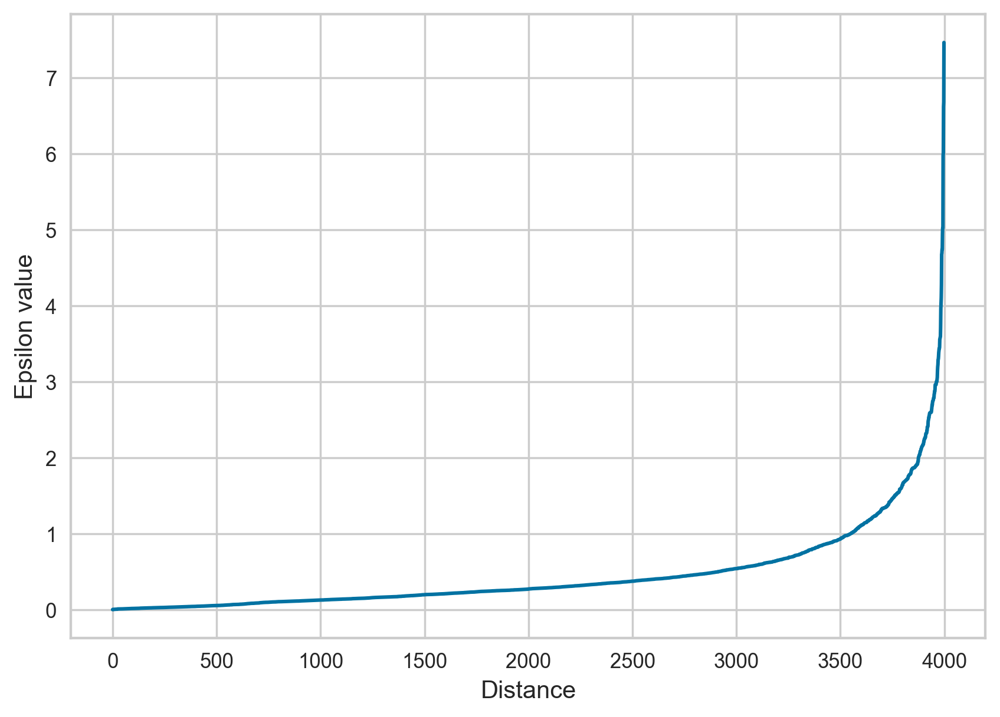

In [77]:
plt.plot(dist)
plt.xlabel('Distance')
plt.ylabel('Epsilon value')

In [78]:
db = DBSCAN(eps=3,min_samples=3)
ypred = db.fit_predict(x)
ypred


array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [79]:
silhouette_score(x,ypred)

0.5390274286985567

In [80]:
airlines['cluster_dbscan'] = ypred
airlines

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award,Cluster_h,y_h,cluster_k,cluster_dbscan
0,28143,0,1,1,1,174,1,0,0,7000,0,0,1,1,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0,1,1,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0,1,1,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0,1,1,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1,1,0,1,0
3995,64385,0,1,1,1,981,5,0,0,1395,1,0,1,1,0
3996,73597,0,3,1,1,25447,8,0,0,1402,1,0,1,1,0
3997,54899,0,1,1,1,500,1,500,1,1401,0,0,1,1,0


In [81]:
airlines.groupby('cluster_dbscan').agg('mean')

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award,Cluster_h,y_h,cluster_k
cluster_dbscan,,,,,,,,,,,,,,
-1,363917.176471,1135.803922,3.078431,1.098039,1.431373,76900.666667,32.490196,5739.294118,14.686275,5104.980392,0.843137,0.411765,0.588235,0.627451
0,70108.966650,125.341970,2.053361,1.000000,1.000000,16236.394561,11.256542,392.526680,1.199590,4105.397127,0.363520,0.251924,0.806824,0.864546
1,45781.714286,0.000000,1.000000,3.000000,1.000000,20147.571429,16.928571,410.000000,1.714286,4137.642857,0.357143,0.785714,0.214286,0.357143
2,39187.040000,0.000000,1.120000,2.000000,1.000000,11107.040000,14.840000,224.000000,0.800000,3703.240000,0.320000,0.360000,0.640000,0.720000
3,102022.600000,0.000000,3.600000,1.000000,4.000000,90060.800000,27.000000,210.000000,0.600000,4730.200000,0.400000,1.000000,0.000000,0.000000
4,56112.333333,0.000000,3.333333,1.000000,5.000000,105025.666667,28.000000,366.666667,1.000000,5223.666667,1.000000,1.000000,0.000000,0.000000
5,62703.666667,9935.000000,1.666667,1.000000,1.000000,8572.333333,11.333333,1166.666667,6.000000,5699.000000,1.000000,0.333333,0.666667,1.000000


In [82]:
airlines[airlines['cluster_dbscan']==-1]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award,Cluster_h,y_h,cluster_k,cluster_dbscan
8,443003,0,3,2,1,1753,43,3850,12,6948,1,0,1,1,-1
106,96627,1182,1,1,3,49059,26,2300,9,6738,1,1,0,0,-1
126,602064,0,5,1,1,194753,26,2250,10,7652,1,0,1,1,-1
151,930410,0,5,1,1,211284,18,2250,6,7640,1,0,1,1,-1
186,707079,0,4,1,1,57173,40,3450,12,7523,1,0,1,1,-1
190,123516,0,5,1,1,240544,31,500,2,7507,1,1,0,0,-1
220,1302051,2706,5,1,1,90653,32,3050,7,7467,1,0,1,1,-1
275,1704838,0,1,1,1,17108,32,4823,23,7283,1,0,1,1,-1
343,112501,0,1,1,2,19140,11,0,0,7101,0,0,1,1,-1
380,377252,0,5,1,1,230629,30,6393,13,6996,1,1,0,0,-1


In [83]:
airlines[airlines['cluster_dbscan']==0]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,award,Cluster_h,y_h,cluster_k,cluster_dbscan
0,28143,0,1,1,1,174,1,0,0,7000,0,0,1,1,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0,1,1,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0,1,1,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0,1,1,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1,1,0,1,0
3995,64385,0,1,1,1,981,5,0,0,1395,1,0,1,1,0
3996,73597,0,3,1,1,25447,8,0,0,1402,1,0,1,1,0
3997,54899,0,1,1,1,500,1,500,1,1401,0,0,1,1,0


In [84]:
airlines['cluster_dbscan'].value_counts()

 0    3898
-1      51
 2      25
 1      14
 3       5
 5       3
 4       3
Name: cluster_dbscan, dtype: int64

## Inferances
- In Hiericharical clustering we have 3 clusters 
- In k means clustering we have 3 clusters
- In DBSCAN  we have 7 clusters

so there are total 3 clusters and hiericharical clustering is best fitted algorithm for the given dataset

## Crime Data

In [85]:
crime = pd.read_csv(r'C:\Users\shree\Desktop\subject\Data_Science\DS_Assignments\Datasets\crime_data.csv')
crime

,Unnamed: 0,Murder,Assault,UrbanPop,Rape
0,Alabama,13.2,236,58,21.2
1,Alaska,10.0,263,48,44.5
2,Arizona,8.1,294,80,31.0
3,Arkansas,8.8,190,50,19.5
4,California,9.0,276,91,40.6
5,Colorado,7.9,204,78,38.7
6,Connecticut,3.3,110,77,11.1
7,Delaware,5.9,238,72,15.8
8,Florida,15.4,335,80,31.9
9,Georgia,17.4,211,60,25.8


In [86]:
crime.shape

(50, 5)

In [87]:
crime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  50 non-null     object 
 1   Murder      50 non-null     float64
 2   Assault     50 non-null     int64  
 3   UrbanPop    50 non-null     int64  
 4   Rape        50 non-null     float64
dtypes: float64(2), int64(2), object(1)
memory usage: 2.1+ KB


In [88]:
crime.isnull().sum()

Unnamed: 0    0
Murder        0
Assault       0
UrbanPop      0
Rape          0
dtype: int64

In [89]:
crime_data = crime.drop(columns = ['Unnamed: 0'])
crime_data

,Murder,Assault,UrbanPop,Rape
0,13.2,236,58,21.2
1,10.0,263,48,44.5
2,8.1,294,80,31.0
3,8.8,190,50,19.5
4,9.0,276,91,40.6
5,7.9,204,78,38.7
6,3.3,110,77,11.1
7,5.9,238,72,15.8
8,15.4,335,80,31.9
9,17.4,211,60,25.8


In [90]:
crime_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Murder    50 non-null     float64
 1   Assault   50 non-null     int64  
 2   UrbanPop  50 non-null     int64  
 3   Rape      50 non-null     float64
dtypes: float64(2), int64(2)
memory usage: 1.7 KB


### Feature Scaling

In [91]:
sc = StandardScaler()
crime_x = sc.fit_transform(crime_data)
crime_x = pd.DataFrame(crime_x)
crime_x

,0,1,2,3
0,1.255179,0.790787,-0.526195,-0.003451
1,0.513019,1.118060,-1.224067,2.509424
2,0.072361,1.493817,1.009122,1.053466
3,0.234708,0.233212,-1.084492,-0.186794
4,0.281093,1.275635,1.776781,2.088814
5,0.025976,0.402909,0.869548,1.883901
6,-1.040880,-0.736484,0.799761,-1.092723
7,-0.437875,0.815030,0.450825,-0.585834
8,1.765415,1.990786,1.009122,1.150530
9,2.229265,0.487757,-0.386621,0.492653


In [92]:
crime_x_normalize = pd.DataFrame(normalize(crime_data),columns = crime_data.columns)
crime_x_normalize

,Murder,Assault,UrbanPop,Rape
0,0.054031,0.966016,0.237411,0.086778
1,0.036872,0.969739,0.176987,0.164081
2,0.026439,0.959624,0.261122,0.101185
3,0.044528,0.961392,0.252998,0.098669
4,0.030657,0.940134,0.309972,0.138295
5,0.035594,0.919142,0.351437,0.174367
6,0.024486,0.816202,0.571341,0.082362
7,0.023674,0.954965,0.288897,0.063397
8,0.044478,0.967547,0.231056,0.092134
9,0.078534,0.952332,0.270805,0.116446


## Hierachical Clustering

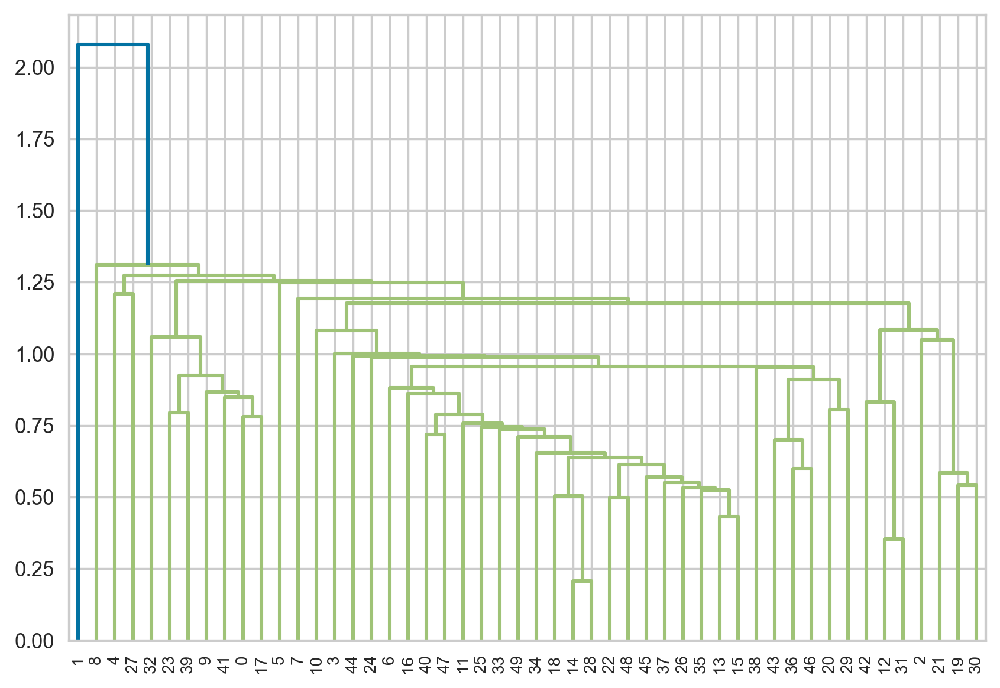

In [93]:
lk = hierarchy.linkage(crime_x,method='single')
dendrogram = hierarchy.dendrogram(lk)

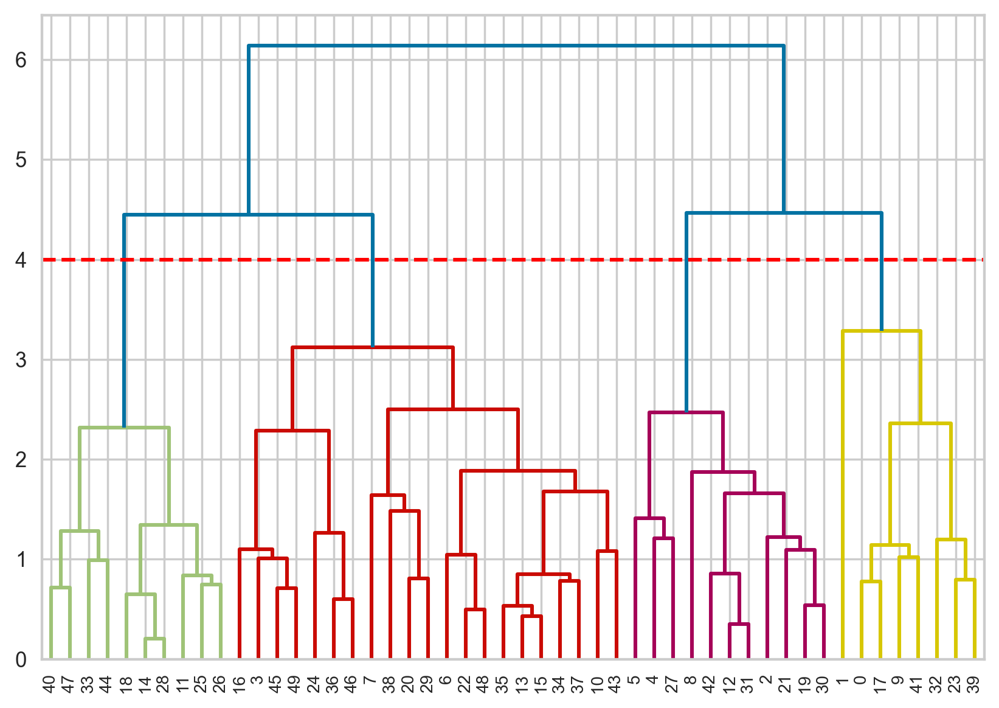

In [94]:
lk = hierarchy.linkage(crime_x,method='complete')
dendrogram = hierarchy.dendrogram(lk)
plt.axhline(y = 4, c = 'red', linestyle = '--')

In [95]:
hc = AgglomerativeClustering(n_clusters=2)

y = hc.fit_predict(crime_x)

In [96]:
crime_data['Cluster_h'] = y
crime_data

,Murder,Assault,UrbanPop,Rape,Cluster_h
0,13.2,236,58,21.2,1
1,10.0,263,48,44.5,1
2,8.1,294,80,31.0,1
3,8.8,190,50,19.5,0
4,9.0,276,91,40.6,1
5,7.9,204,78,38.7,1
6,3.3,110,77,11.1,0
7,5.9,238,72,15.8,0
8,15.4,335,80,31.9,1
9,17.4,211,60,25.8,1


In [97]:
crime_data.groupby('Cluster_h').agg('mean')

,Murder,Assault,UrbanPop,Rape
Cluster_h,,,,
0,5.003226,116.483871,63.838710,16.338710
1,12.331579,259.315789,68.315789,29.215789


<Axes: xlabel='Murder', ylabel='Assault'>

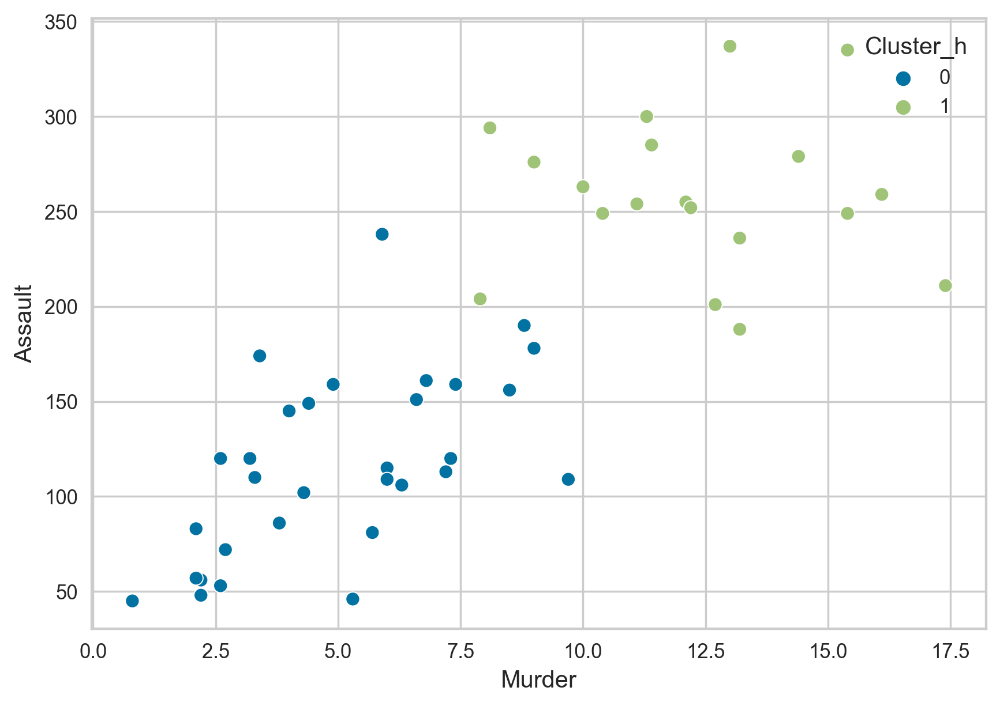

In [98]:
sns.scatterplot(x = crime_data['Murder'], y = crime_data['Assault'], hue = crime_data['Cluster_h'])

In [99]:
crime_data[crime_data['Cluster_h'] == 0]

,Murder,Assault,UrbanPop,Rape,Cluster_h
3,8.8,190,50,19.5,0
6,3.3,110,77,11.1,0
7,5.9,238,72,15.8,0
10,5.3,46,83,20.2,0
11,2.6,120,54,14.2,0
13,7.2,113,65,21.0,0
14,2.2,56,57,11.3,0
15,6.0,115,66,18.0,0
16,9.7,109,52,16.3,0
18,2.1,83,51,7.8,0


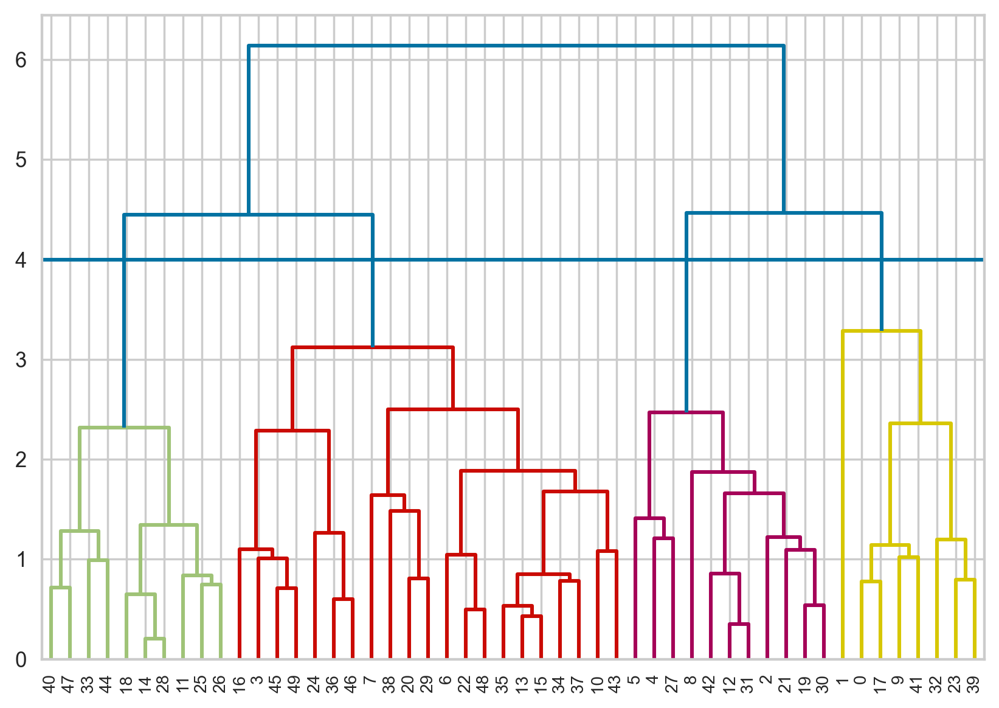

In [100]:
lk = hierarchy.linkage(crime_x, method='complete')
dendrogram = hierarchy.dendrogram(lk)
plt.axhline(y = 4)

In [101]:
hc = AgglomerativeClustering(n_clusters=4)
y = hc.fit_predict(crime_x)
y

array([3, 1, 1, 0, 1, 1, 0, 0, 1, 3, 0, 2, 1, 0, 2, 0, 0, 3, 2, 1, 0, 1,
       2, 3, 0, 2, 2, 1, 2, 0, 1, 1, 3, 2, 0, 0, 0, 0, 0, 3, 2, 3, 1, 0,
       2, 0, 0, 2, 2, 0], dtype=int64)

In [102]:
crime_data['Cluster_h_m'] = y
crime_data

,Murder,Assault,UrbanPop,Rape,Cluster_h,Cluster_h_m
0,13.2,236,58,21.2,1,3
1,10.0,263,48,44.5,1,1
2,8.1,294,80,31.0,1,1
3,8.8,190,50,19.5,0,0
4,9.0,276,91,40.6,1,1
5,7.9,204,78,38.7,1,1
6,3.3,110,77,11.1,0,0
7,5.9,238,72,15.8,0,0
8,15.4,335,80,31.9,1,1
9,17.4,211,60,25.8,1,3


In [103]:
crime_data.groupby('Cluster_h_m').agg('mean')

,Murder,Assault,UrbanPop,Rape,Cluster_h
Cluster_h_m,,,,,
0,6.210526,142.052632,71.263158,19.184211,0.0
1,10.966667,264.000000,76.500000,33.608333,1.0
2,3.091667,76.000000,52.083333,11.833333,0.0
3,14.671429,251.285714,54.285714,21.685714,1.0


<Axes: xlabel='Murder', ylabel='Assault'>

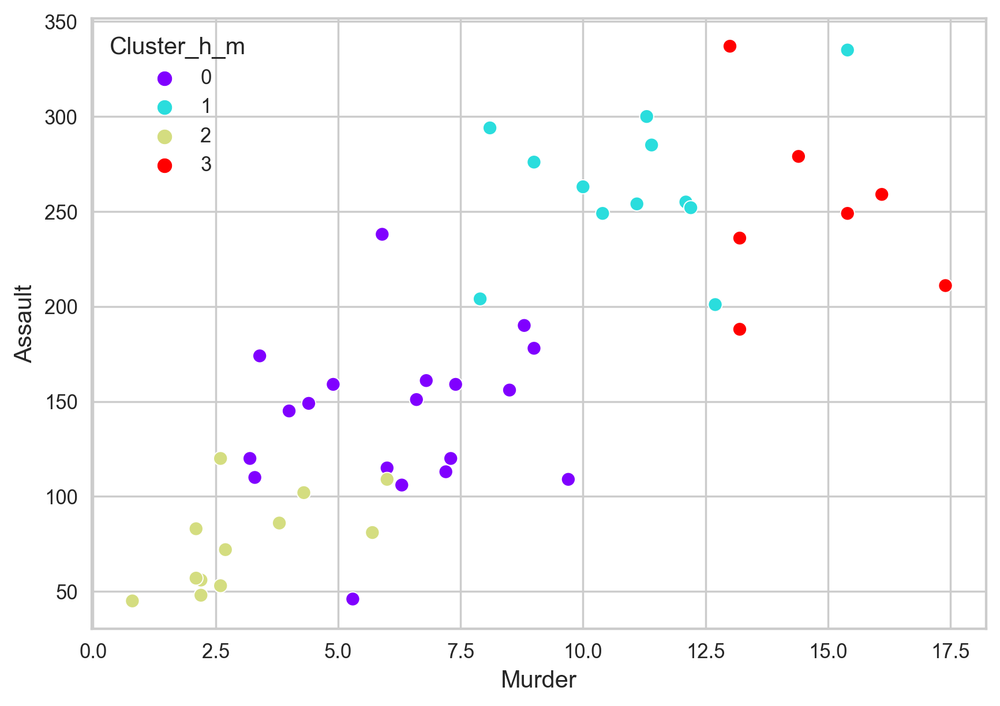

In [104]:
sns.scatterplot(x = crime_data['Murder'], y = crime_data['Assault'], hue = crime_data['Cluster_h_m'], palette='rainbow')

In [105]:
crime_data[crime_data['Cluster_h_m'] == 2]

,Murder,Assault,UrbanPop,Rape,Cluster_h,Cluster_h_m
11,2.6,120,54,14.2,0,2
14,2.2,56,57,11.3,0,2
18,2.1,83,51,7.8,0,2
22,2.7,72,66,14.9,0,2
25,6.0,109,53,16.4,0,2
26,4.3,102,62,16.5,0,2
28,2.1,57,56,9.5,0,2
33,0.8,45,44,7.3,0,2
40,3.8,86,45,12.8,0,2
44,2.2,48,32,11.2,0,2


In [106]:
crime_data['Cluster_h_m'].value_counts()

0    19
1    12
2    12
3     7
Name: Cluster_h_m, dtype: int64

## K means Clustering

In [107]:
km = KMeans()
y_k = km.fit_predict(crime_x)

In [108]:
#cluster centre
km.cluster_centers_

array([[-0.63817386, -0.38827513,  0.88223651, -0.27797516],
       [ 1.59644066,  0.97606837, -0.78540457,  0.0489325 ],
       [ 0.44344101,  0.88775677,  1.2417461 ,  2.21463743],
       [-1.08146728, -1.28193823, -1.78236392, -1.19517947],
       [ 0.80936747,  1.09651079,  0.7764984 ,  0.84615706],
       [-0.15956455, -0.44557535, -0.39437496, -0.32460067],
       [-1.25347849, -1.17890802, -0.50293276, -1.0585711 ],
       [ 0.51301858,  1.11805959, -1.22406668,  2.50942392]])

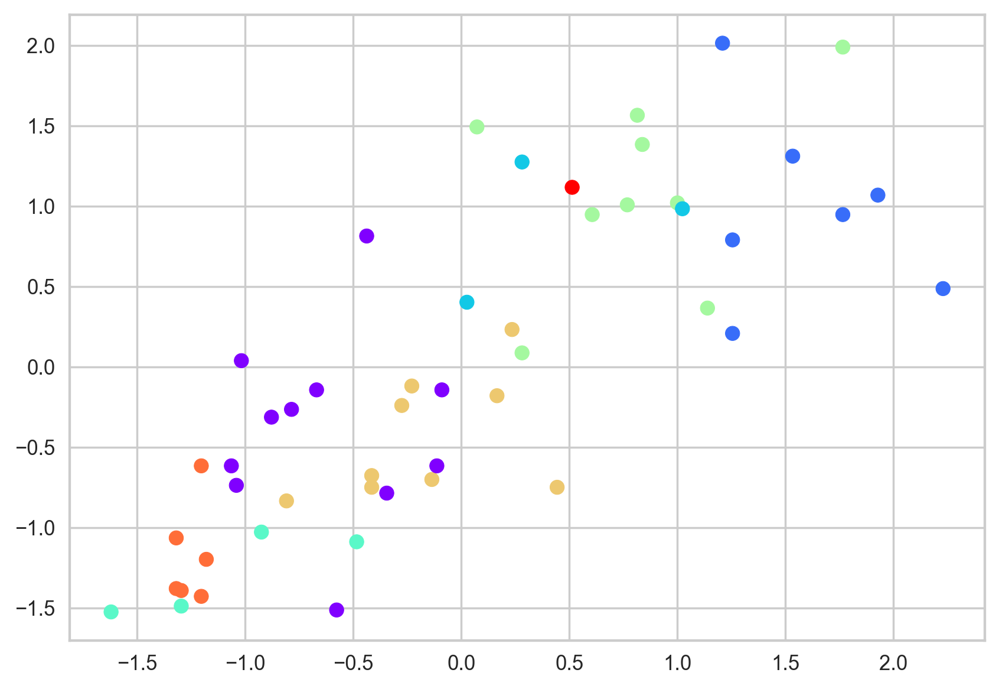

In [109]:
#Visualize the clusters
plt.scatter(crime_x.iloc[:,0],crime_x.iloc[:,1],c = y_k, cmap='rainbow')

In [110]:
silhouette_score(crime_x,y_k)

0.264273401637623

In [111]:
wcss = []

for i in range(1,20):
    km = KMeans(n_clusters=i)
    km.fit_predict(crime_x)
    wcss.append(km.inertia_)

In [112]:
wcss

[200.0,
 104.96163315756871,
 79.92170303159772,
 57.55425863091104,
 50.33327385184907,
 44.19545128086062,
 39.32001748795468,
 36.60491937537549,
 30.840998687271412,
 27.06880477769172,
 24.848898099758554,
 22.520061382966915,
 20.872554741833063,
 19.193267128498423,
 18.118873706491648,
 17.369181537439786,
 15.782052837241913,
 14.295212906632898,
 13.345706766216889]

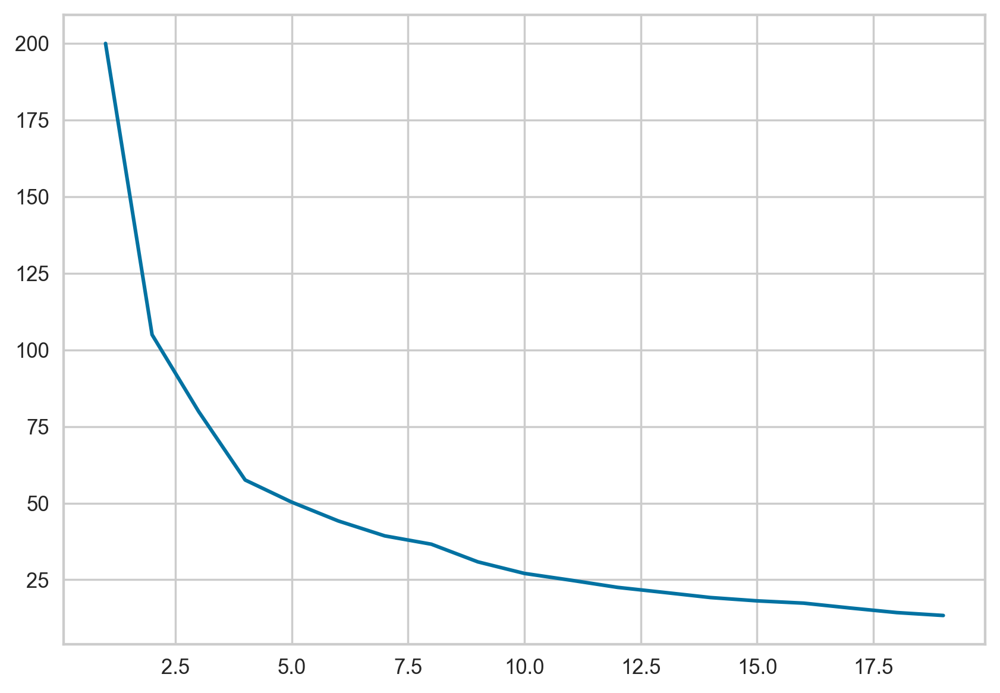

In [113]:
plt.plot(range(1,20),wcss)

In [114]:
km = KMeans(n_clusters=2)
ypred = km.fit_predict(crime_x)
ypred

array([0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0,
       1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 1])

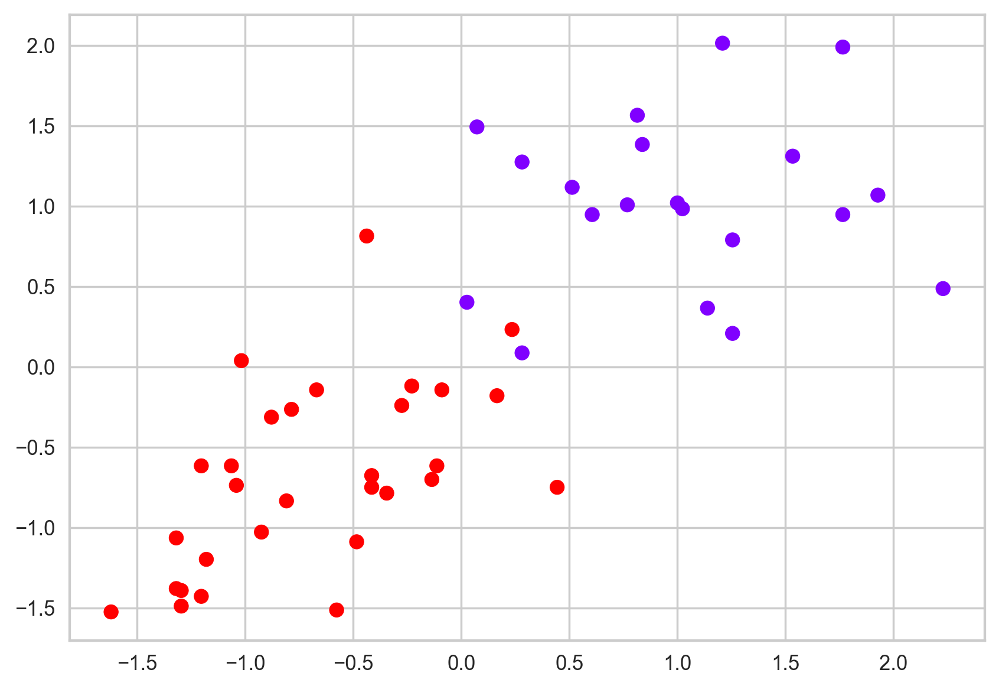

In [115]:
plt.scatter(crime_x.iloc[:,0],crime_x.iloc[:,1],c = ypred, cmap='rainbow')

In [116]:
km.cluster_centers_

array([[ 1.01513667,  1.02412028,  0.19959126,  0.85556386],
       [-0.67675778, -0.68274685, -0.13306084, -0.57037591]])

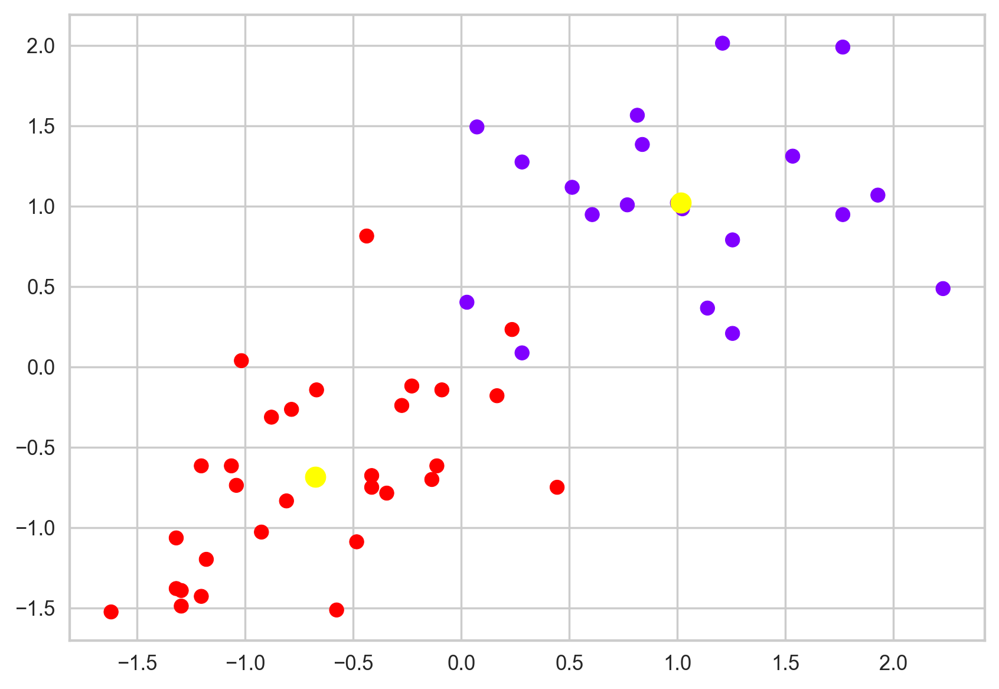

In [117]:
plt.scatter(crime_x.iloc[:,0],crime_x.iloc[:,1],c = ypred, cmap='rainbow')
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1],color = 'yellow',s=100)

In [118]:
silhouette_score(crime_x,ypred)

0.4084890326217641

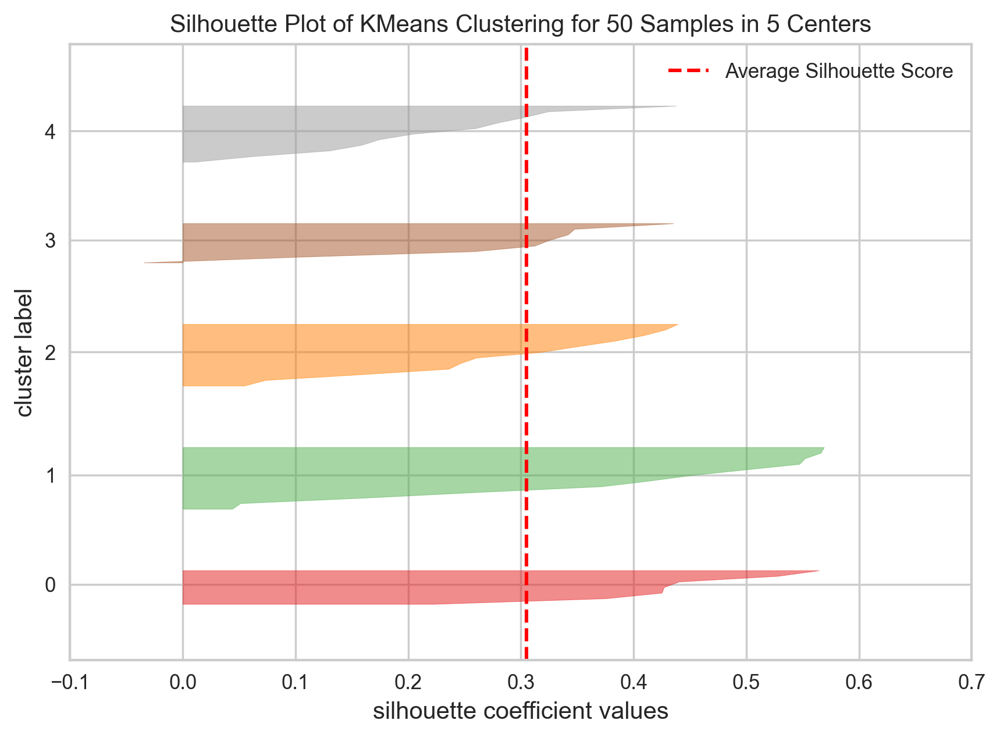

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 50 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [119]:
from yellowbrick.cluster import SilhouetteVisualizer
model = SilhouetteVisualizer(KMeans(n_clusters=5))
vis = model.fit(crime_x)
vis.show()

In [120]:
sil_score = []

for i in range(2,20):
    km = KMeans(n_clusters=i)
    y = km.fit_predict(crime_x)
    sil_score.append(silhouette_score(crime_x,y))

In [121]:
sil_score

[0.4084890326217641,
 0.30813622648945616,
 0.33968891433344395,
 0.3100723844478907,
 0.31608558275094967,
 0.29361819680545925,
 0.2839401274172417,
 0.2567961233867619,
 0.2672845111411144,
 0.2671364475682844,
 0.25748284697004503,
 0.25381737296549933,
 0.2367967534717194,
 0.2545423808648282,
 0.24047424510673326,
 0.24502263076695402,
 0.2087807609575135,
 0.21725558037019319]

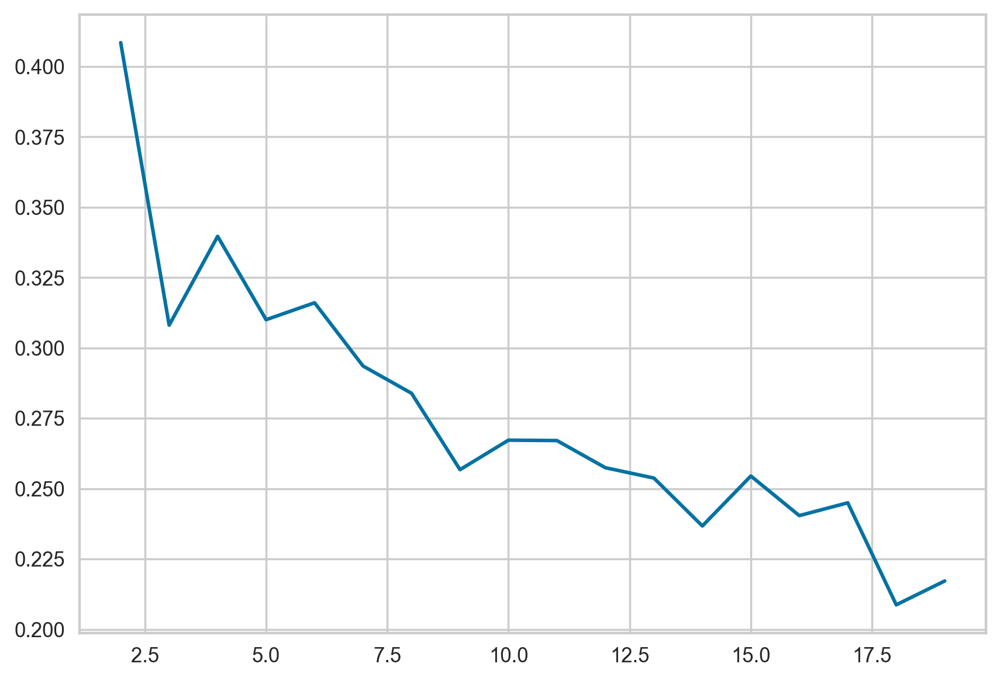

In [125]:
plt.plot(range(2,20),sil_score)

In [123]:
crime_data['cluster_k'] = ypred
crime_data

,Murder,Assault,UrbanPop,Rape,Cluster_h,Cluster_h_m,cluster_k
0,13.2,236,58,21.2,1,3,0
1,10.0,263,48,44.5,1,1,0
2,8.1,294,80,31.0,1,1,0
3,8.8,190,50,19.5,0,0,1
4,9.0,276,91,40.6,1,1,0
5,7.9,204,78,38.7,1,1,0
6,3.3,110,77,11.1,0,0,1
7,5.9,238,72,15.8,0,0,1
8,15.4,335,80,31.9,1,1,0
9,17.4,211,60,25.8,1,3,0


In [124]:
crime_data.groupby('cluster_k').agg('mean')

,Murder,Assault,UrbanPop,Rape,Cluster_h,Cluster_h_m
cluster_k,,,,,,
0,12.165,255.250000,68.400000,29.165000,0.95,1.65
1,4.870,114.433333,63.633333,15.943333,0.00,0.80


## DBSCAN

In [126]:
db = DBSCAN(eps=1, min_samples=5)

y = db.fit_predict(crime_x)

In [127]:
y

array([-1, -1, -1, -1, -1, -1,  0, -1, -1, -1, -1,  0, -1,  0,  0,  0,  0,
       -1,  0, -1,  1, -1,  0, -1,  0,  0,  0, -1,  0,  1, -1, -1, -1,  0,
        0,  0,  0,  0,  1, -1,  0, -1, -1,  0, -1,  0,  0,  0,  0,  0],
      dtype=int64)

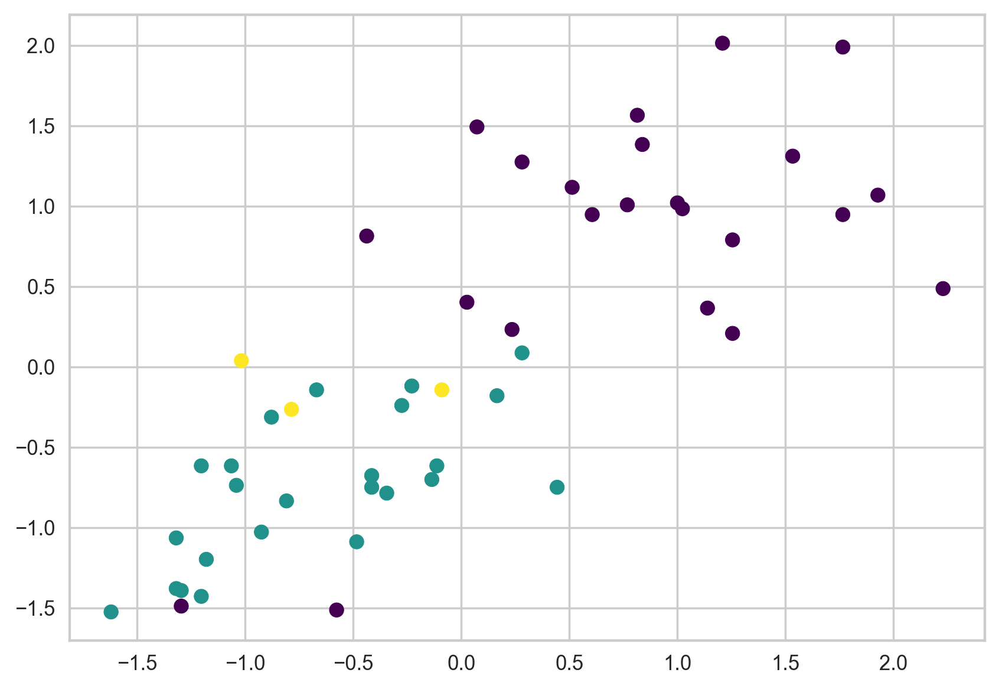

In [128]:
plt.scatter(crime_x.iloc[:,0],crime_x.iloc[:,1],c = y,cmap='viridis')

In [129]:
silhouette_score(crime_x,y)

0.19486631995858555

In [130]:
neigh = NearestNeighbors(n_neighbors=3).fit(crime_x)
d,i = neigh.kneighbors(crime_x)

In [131]:
pd.DataFrame(d)

,0,1,2
0,0.0,0.780062,0.849285
1,0.0,2.078984,2.136971
2,0.0,1.048220,1.083411
3,0.0,1.001328,1.007227
4,0.0,1.208977,1.300691
5,0.0,1.248863,1.300691
6,0.0,0.881004,0.956432
7,0.0,1.192276,1.271401
8,0.0,1.309743,1.349263
9,0.0,0.867978,1.022502


In [132]:
d

array([[0.        , 0.78006247, 0.84928467],
       [0.        , 2.07898369, 2.13697134],
       [0.        , 1.0482199 , 1.08341076],
       [0.        , 1.0013278 , 1.00722663],
       [0.        , 1.20897691, 1.30069114],
       [0.        , 1.24886253, 1.30069114],
       [0.        , 0.88100359, 0.95643249],
       [0.        , 1.19227586, 1.27140067],
       [0.        , 1.30974334, 1.34926273],
       [0.        , 0.86797806, 1.02250187],
       [0.        , 1.08184506, 1.16110091],
       [0.        , 0.75913104, 0.81522244],
       [0.        , 0.35377437, 0.83250223],
       [0.        , 0.43312429, 0.53571007],
       [0.        , 0.2079438 , 0.63822131],
       [0.        , 0.43312429, 0.52515083],
       [0.        , 0.8610239 , 1.07057017],
       [0.        , 0.78006247, 0.86797806],
       [0.        , 0.50466926, 0.65227142],
       [0.        , 0.54082482, 1.09106451],
       [0.        , 0.80586349, 0.91073424],
       [0.        , 0.58411812, 1.09106451],
       [0.

In [133]:
dist = np.sort(d[:,1])

Text(0, 0.5, 'Epsilon value')

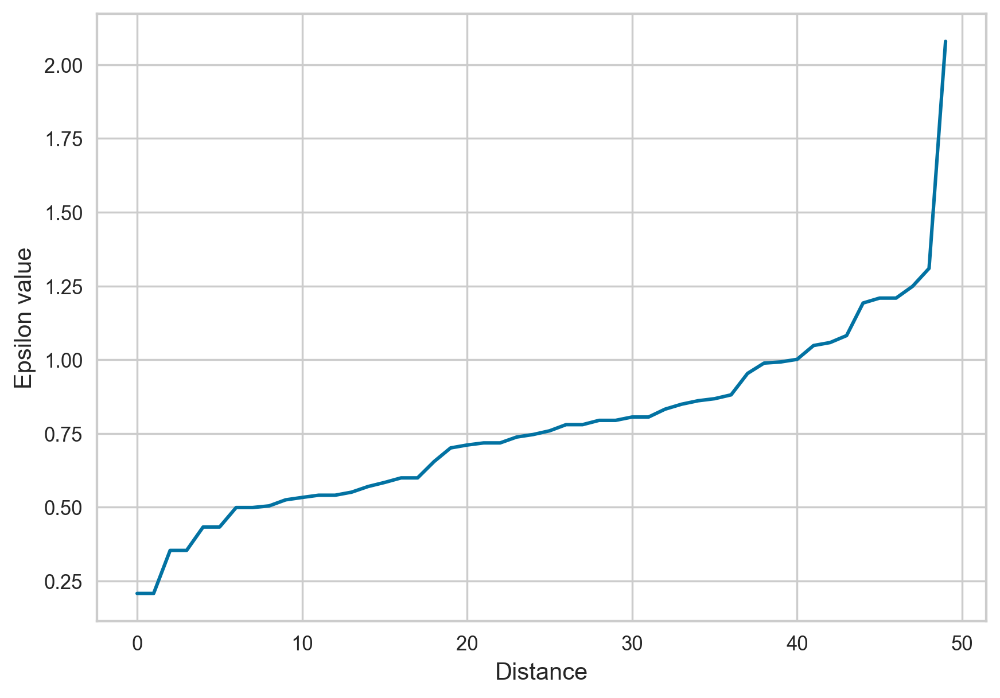

In [134]:
plt.plot(dist)
plt.xlabel('Distance')
plt.ylabel('Epsilon value')


In [135]:
db = DBSCAN(eps=1,min_samples=3)
ypred = db.fit_predict(crime_x)
ypred

array([ 0, -1, -1, -1, -1, -1,  1, -1, -1,  0, -1,  1,  2,  1,  1,  1,  1,
        0,  1,  3,  1,  3,  1,  0,  1,  1,  1, -1,  1,  1,  3,  2, -1,  1,
        1,  1,  1,  1,  1,  0,  1,  0,  2,  1,  1,  1,  1,  1,  1,  1],
      dtype=int64)

In [136]:
silhouette_score(crime_x,ypred)

0.19290975823254836

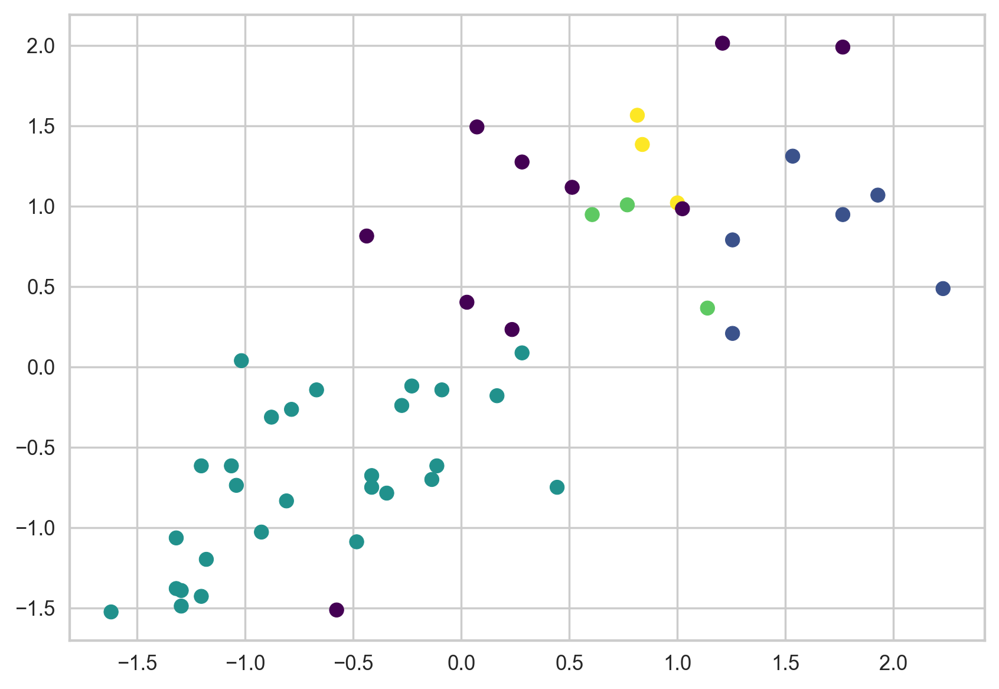

In [137]:
plt.scatter(crime_x.iloc[:,0],crime_x.iloc[:,1],c = ypred,cmap='viridis')

In [138]:
crime_x['cluster_d'] = ypred
crime_x

,0,1,2,3,cluster_d
0,1.255179,0.790787,-0.526195,-0.003451,0
1,0.513019,1.118060,-1.224067,2.509424,-1
2,0.072361,1.493817,1.009122,1.053466,-1
3,0.234708,0.233212,-1.084492,-0.186794,-1
4,0.281093,1.275635,1.776781,2.088814,-1
5,0.025976,0.402909,0.869548,1.883901,-1
6,-1.040880,-0.736484,0.799761,-1.092723,1
7,-0.437875,0.815030,0.450825,-0.585834,-1
8,1.765415,1.990786,1.009122,1.150530,-1
9,2.229265,0.487757,-0.386621,0.492653,0


In [139]:
crime_x.groupby('cluster_d').agg('mean')

,0,1,2,3
cluster_d,,,,
-1,0.410971,0.881696,0.367080,0.991992
0,1.661048,0.802908,-0.677401,0.149335
1,-0.687194,-0.711809,-0.152335,-0.552709
2,0.837714,0.774626,1.218484,0.427944
3,0.884099,1.324120,0.334513,1.125365


In [140]:
crime_x[crime_x['cluster_d']==-1]

,0,1,2,3,cluster_d
1,0.513019,1.118060,-1.224067,2.509424,-1
2,0.072361,1.493817,1.009122,1.053466,-1
3,0.234708,0.233212,-1.084492,-0.186794,-1
4,0.281093,1.275635,1.776781,2.088814,-1
5,0.025976,0.402909,0.869548,1.883901,-1
7,-0.437875,0.815030,0.450825,-0.585834,-1
8,1.765415,1.990786,1.009122,1.150530,-1
10,-0.577030,-1.512241,1.218484,-0.111300,-1
27,1.023254,0.984726,1.078909,2.671197,-1
32,1.208794,2.015028,-1.433428,-0.553480,-1


### Inferance
- In Hiericharical clustering we have 5 clusters
- In k means clustering we have 5 clusters
- In DBSCAN we have 5 clusters

so we have 5 cliusters for the given data set 